# Import the necessary libraries

In [1]:
pip install rembg[gpu]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 86.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.2/226.2 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:
import rembg
from PIL import Image
import numpy as np
import pandas as pd
from tqdm import tqdm
import shutil, os, torch, time, copy, torchvision, zipfile, cv2
import matplotlib.pyplot as plt
from torchvision import transforms, models
from torchvision.models import resnet18, ResNet18_Weights
from torchvision.models import resnet34, ResNet34_Weights
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.models import resnet152, ResNet152_Weights
from torch.utils.data import ConcatDataset
import matplotlib.pyplot as plt
import torch.nn as nn
import torch, random

# Set the seed value for reproducibility

In [3]:
def set_seed(seed_value):
    """Set seed for reproducibility."""
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)  # if using multi-GPU
    np.random.seed(seed_value)
    random.seed(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Set seed for reproducibility
set_seed(42)

# Create a generator with a fixed seed
g = torch.Generator()
g.manual_seed(42)

def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

# Download the competition files


In [4]:
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

import zipfile
with zipfile.ZipFile('../input/plates.zip', 'r') as zip_obj:
   # Extract all the contents of zip file in current directory
   zip_obj.extractall('/kaggle/working/')
    
print('After zip extraction:')
print(os.listdir("/kaggle/working/"))

['sample_submission.csv', 'plates.zip']
After zip extraction:
['__MACOSX', '__notebook__.ipynb', 'plates']


In [5]:
data_root = '/kaggle/working/plates/'
print(os.listdir(data_root))

['test', '.DS_Store', 'train']


# Remove background from the plates' photos

### Define a visualization helper function

In [6]:
def showimage(in_image, out_image):
    # Convert BGR to RGB if necessary
    if in_image.ndim > 2:
        in_image = in_image[:,:,::-1]  # BGR to RGB
    if out_image.ndim > 2:
        out_image = out_image[:,:,::-1]  # BGR to RGB

    # Create a figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    # Display the input image
    ax1.imshow(in_image)
    ax1.set_title('Input Image (With Background)')
    ax1.axis('off')

    # Display the output image
    ax2.imshow(out_image)
    ax2.set_title('Output Image (Background Removed)')
    ax2.axis('off')

    # Adjust the layout and display the plot
    plt.tight_layout()
    plt.show()

### Choose a model, initialize a session and define a function

In [7]:
# Choose a model
model_name = "u2net"

# Initialize the session
rembg_session = rembg.new_session(model_name)

def remove_background(img,session):
    # rembg expects RGB input
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Apply background removal
    output = rembg.remove(img_rgb)
    
    # Create a white background
    white_background = np.ones(output.shape, dtype=np.uint8) * 255
    
    # Blend the output image with the white background using the alpha channel
    alpha = output[:, :, 3] / 255.0
    result_rgb = (output[:, :, :3] * alpha[:, :, np.newaxis] + 
                  white_background[:, :, :3] * (1 - alpha[:, :, np.newaxis])).astype(np.uint8)
    
    # Convert back to BGR for consistency with OpenCV
    result_bgr = cv2.cvtColor(result_rgb, cv2.COLOR_RGB2BGR)
    
    return result_bgr

100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 164GB/s]


### Remove the background of the Train-Dirty images (show every 10 images)

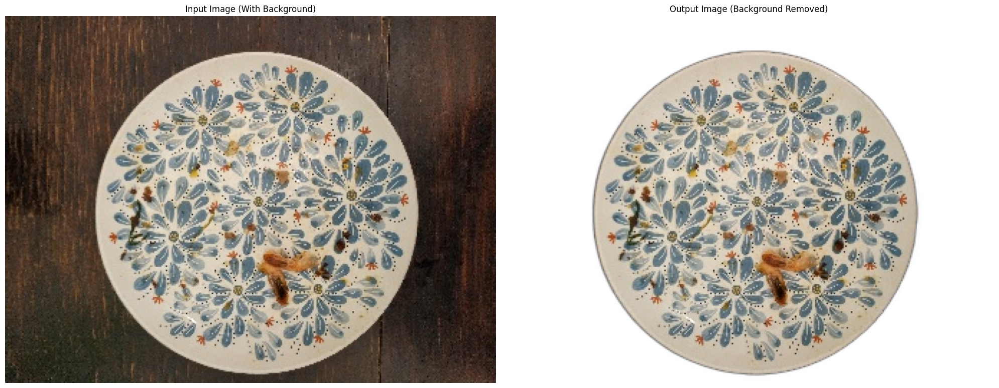

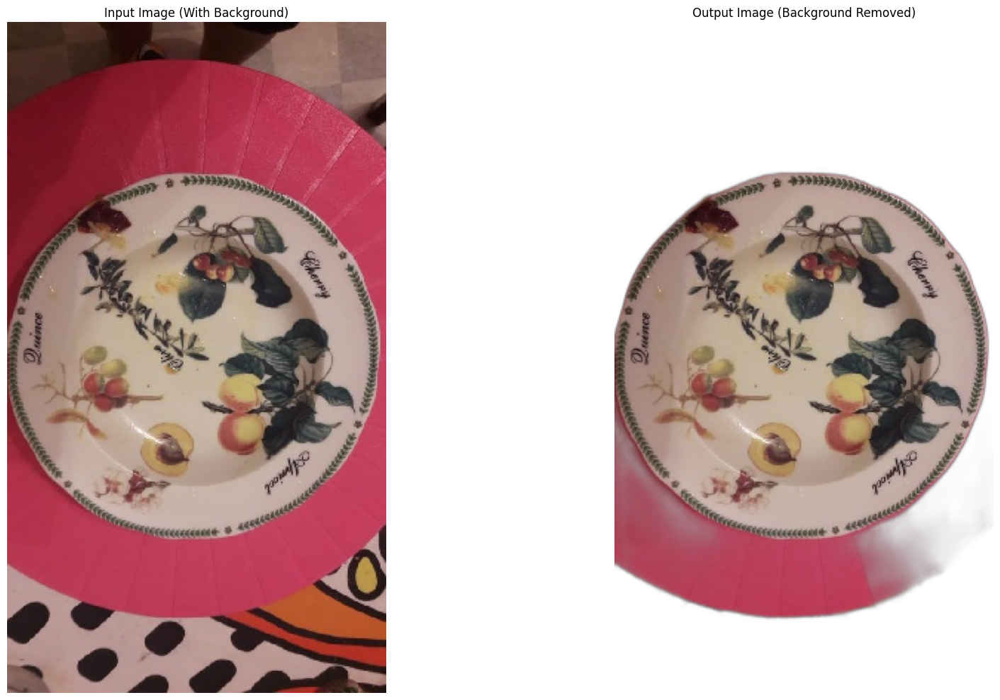

Complete dirty:  0019 /0019


In [8]:
for image_index in range(20):
    print ("Complete dirty: ","{0:04}".format(image_index),"/0019", end="\r")
    image_folder = '/kaggle/working/plates/train/dirty/{0:04}.jpg'.format(image_index) 
    img = cv2.imread(image_folder)

    if img is not None:
        # Remove the background
        out_img  = remove_background(img, rembg_session)

        # Display the comparison for the every 10th image
        if image_index%10==0:
            showimage(img, out_img)

        #Save the processed image
        cv2.imwrite(image_folder, out_img)

print ("\n\r", end="")    

### Remove the background of the Train-Cleaned images (show every 10 images)

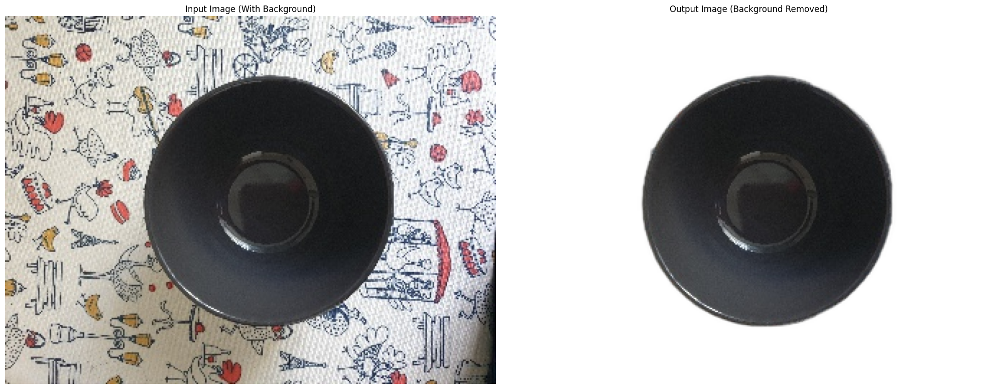

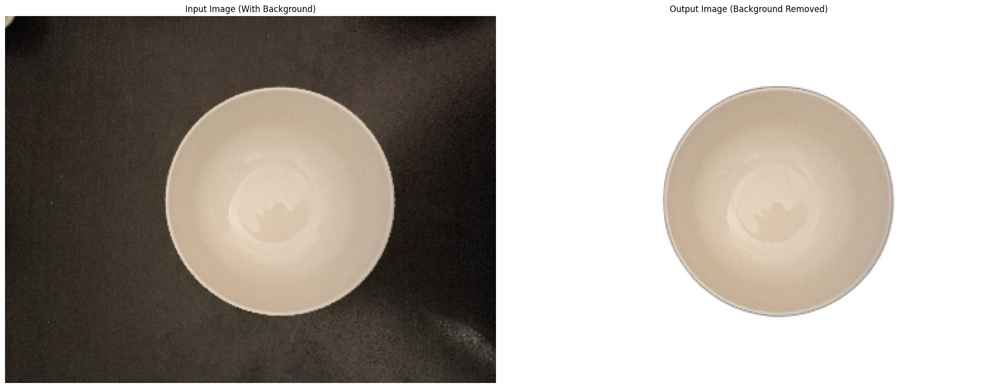

Complete cleaned:  0019 /0019


In [9]:
for image_index in range(20):
    print ("Complete cleaned: ","{0:04}".format(image_index),"/0019", end="\r")
    image_folder = '/kaggle/working/plates/train/cleaned/{0:04}.jpg'.format(image_index) 
    img = cv2.imread(image_folder)

    if img is not None:
        # Remove the background
        out_img  = remove_background(img, rembg_session)

        # Display the comparison for the every 10th image
        if image_index%10==0:
            showimage(img, out_img)

        #Save the processed image
        cv2.imwrite(image_folder, out_img)

print ("\n\r", end="")    

### Remove the background of the Test images (show every 100 images)

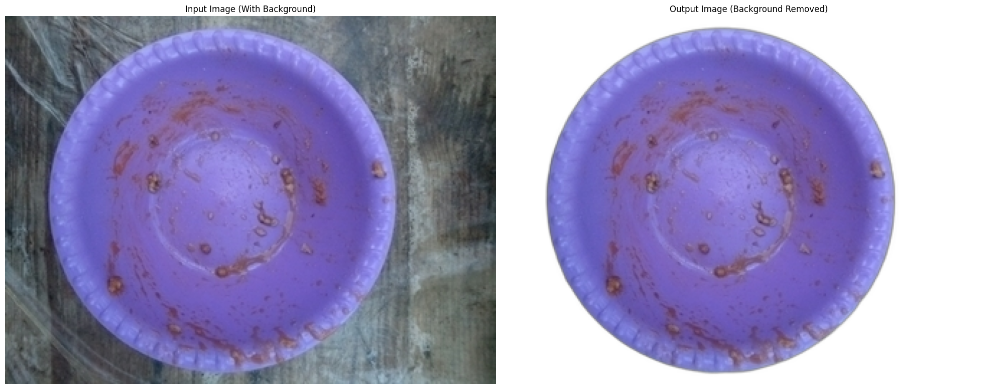

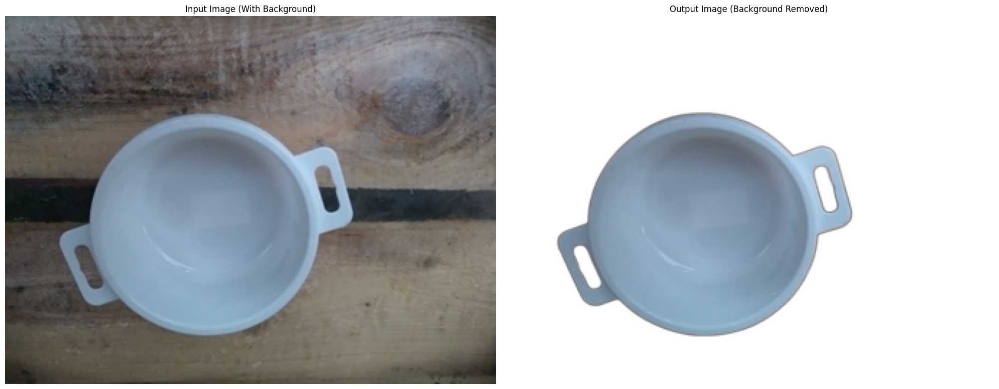

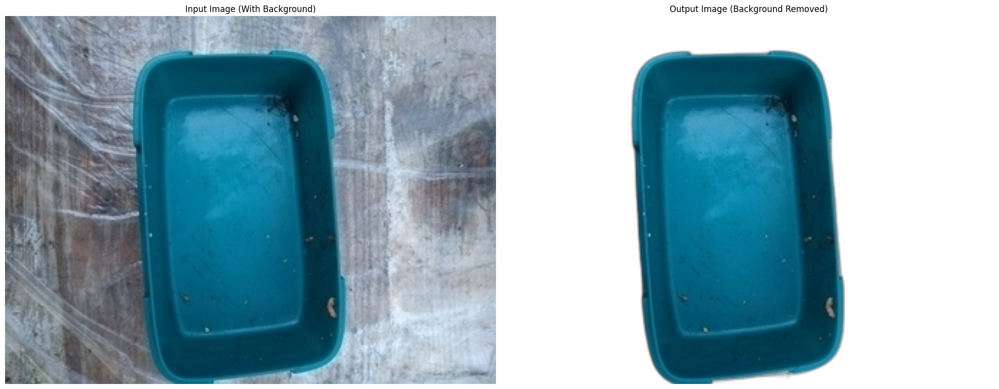

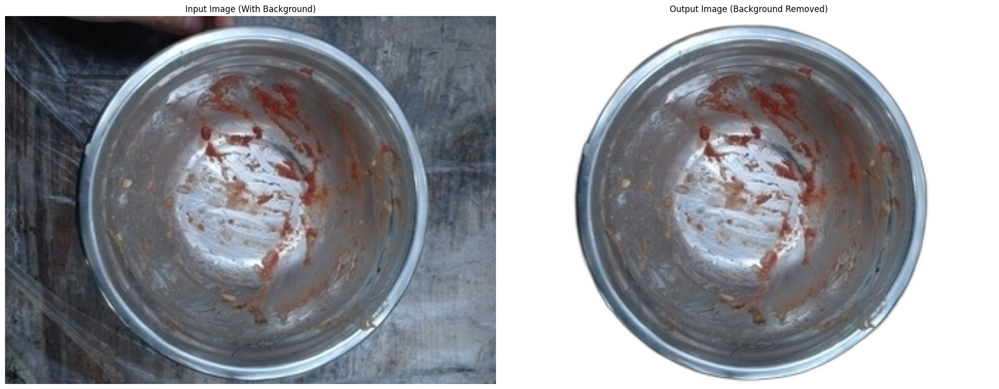

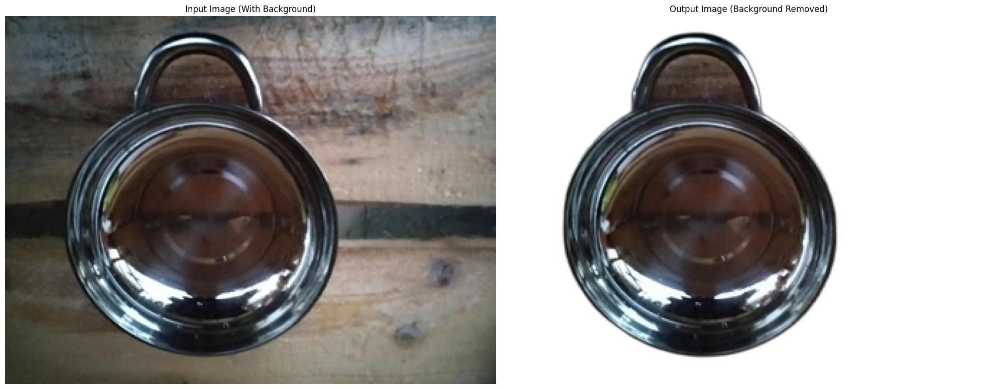

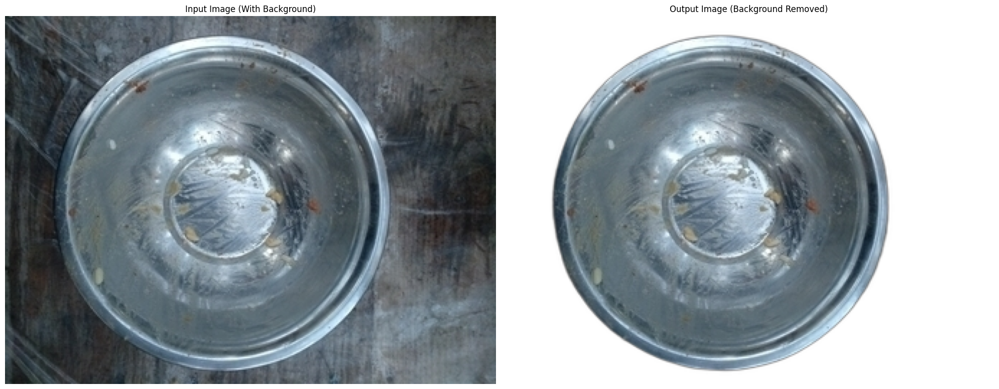

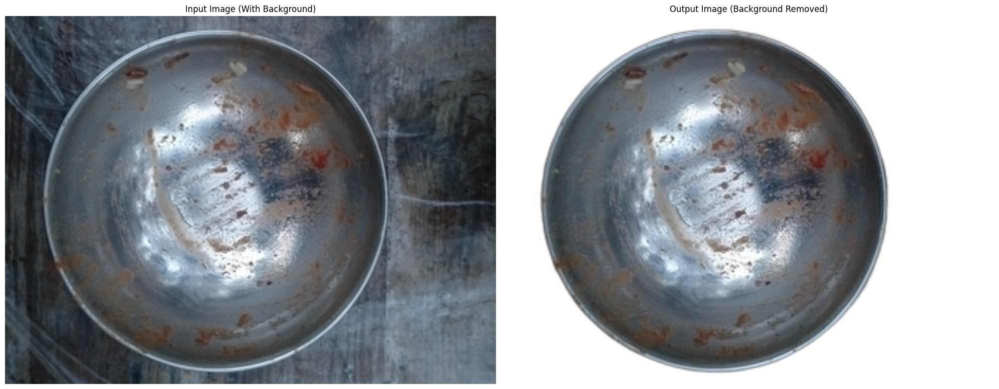

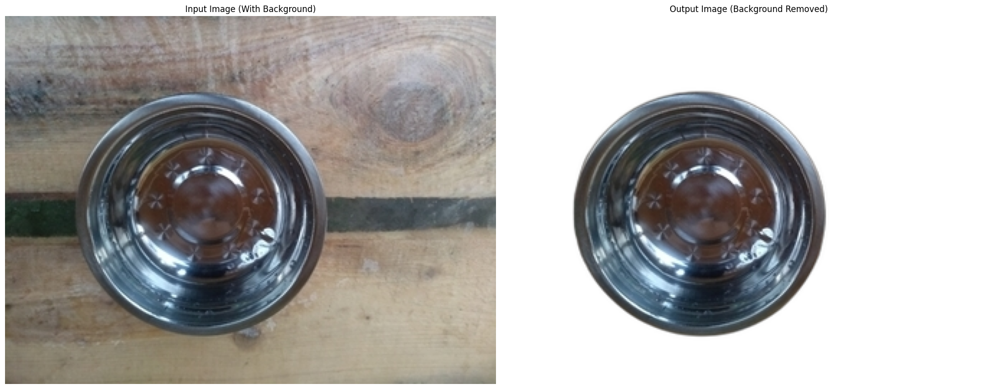

Complete test:  0743 /0743


In [10]:
for image_index in range(744):
    print ("Complete test: ","{0:04}".format(image_index),"/0743", end="\r")
    image_folder = '/kaggle/working/plates/test/{0:04}.jpg'.format(image_index) 
    img = cv2.imread(image_folder)

    if img is not None:
        # Remove the background
        out_img  = remove_background(img, rembg_session)

        # Display the comparison for the every 100th image
        if image_index%100==0:
            showimage(img, out_img)

        #Save the processed image
        cv2.imwrite(image_folder, out_img)

print ("\n\r", end="")    

# Create a validation dataset

Take an every 6-th photo from the train dataset to create a validation dataset.

In [11]:
train_dir = 'train'
val_dir = 'val'

class_names = ['cleaned', 'dirty']

for dir_name in [train_dir, val_dir]:
    for class_name in class_names:
        os.makedirs(os.path.join(dir_name, class_name), exist_ok=True)

for class_name in class_names:
    source_dir = os.path.join(data_root, 'train', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        if i % 6 != 0:
            dest_dir = os.path.join(train_dir, class_name) 
        else:
            dest_dir = os.path.join(val_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

100%|██████████| 21/21 [00:00<00:00, 6628.57it/s]


In [12]:
!ls train

cleaned  dirty


# Define the results plotting function

In [13]:
def plot_training_history(history):
    # Function to convert tensor to numpy array
    def to_numpy(tensor):
        return tensor.cpu().detach().numpy()

    plt.figure(figsize=(12, 4))

    # Accuracy plot
    plt.subplot(121)
    plt.plot(to_numpy(torch.tensor(history['train_acc'])), label='Train')
    plt.plot(to_numpy(torch.tensor(history['val_acc'])), label='Validation')
    plt.title('Accuracy History')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(122)
    plt.plot(to_numpy(torch.tensor(history['train_loss'])), label='Train')
    plt.plot(to_numpy(torch.tensor(history['val_loss'])), label='Validation')
    plt.title('Loss History')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Setup the image augmentations function

In [14]:
def get_transforms(is_train=True, size=224):
    """
    Returns a composition of image transforms.

    Args:
    is_train (bool): If True, returns transforms for training data.
                     If False, returns transforms for validation/test data.

    Returns:
    A composition of transforms from torchvision.transforms
    """

    # Normalize images according to the ResNet specifications
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

    if is_train:
        return transforms.Compose([
            transforms.RandomPerspective(distortion_scale=0.2, p=0.1, interpolation=3, fill=255),
            transforms.RandomChoice([transforms.CenterCrop(180),
                                 transforms.CenterCrop(160),
                                 transforms.CenterCrop(140),
                                 transforms.CenterCrop(120),
                                 transforms.Compose([transforms.CenterCrop(280),
                                                     transforms.Grayscale(3),
                                                     ]),
                                 transforms.Compose([transforms.CenterCrop(200),
                                                     transforms.Grayscale(3),
                                                     ]),
                                 ]),
            transforms.Resize((size, size)),
            transforms.ColorJitter(hue=(0.1, 0.2)),
            transforms.ToTensor(),
            normalize
        ])
    else:
        return transforms.Compose([
            transforms.RandomPerspective(distortion_scale=0.2, p=0.1, interpolation=3, fill=255),
            transforms.RandomChoice([transforms.CenterCrop(180),
                                 transforms.CenterCrop(160),
                                 transforms.CenterCrop(140),
                                 transforms.CenterCrop(120),
                                 transforms.Compose([transforms.CenterCrop(280),
                                                     transforms.Grayscale(3),
                                                     ]),
                                 transforms.Compose([transforms.CenterCrop(200),
                                                     transforms.Grayscale(3),
                                                     ]),
                                 ]),
            transforms.Resize((size, size)),
            transforms.ColorJitter(hue=(0.1, 0.2)),
            transforms.ToTensor(),
            normalize
        ])

# Assing the train and validation datasets together with the batch size

# & Expand the training datset by applying "online augmentation"

In [15]:
# train_dataset = torchvision.datasets.ImageFolder(train_dir, get_transforms(size=300))
# val_dataset = torchvision.datasets.ImageFolder(val_dir, get_transforms(size=300, is_train=False))

batch_size = 8

# Create multiple augmented datasets
train_augmented_datasets = [
    torchvision.datasets.ImageFolder(train_dir, get_transforms(size=300))
    for _ in range(3)
]

# Create multiple augmented datasets
val_augmented_datasets = [
    torchvision.datasets.ImageFolder(train_dir, get_transforms(size=300, is_train=False))
    for _ in range(3)
]

# Combine them into a single dataset
train_combined_dataset = ConcatDataset(train_augmented_datasets)
val_combined_dataset = ConcatDataset(val_augmented_datasets)


# Create data loaders

train_dataloader = torch.utils.data.DataLoader(
    train_combined_dataset, 
    batch_size=batch_size, 
    shuffle=True, 
    num_workers=batch_size,
    worker_init_fn=seed_worker
)

# train_dataloader = torch.utils.data.DataLoader(
#     train_dataset, 
#     batch_size=batch_size, 
#     shuffle=True, 
#     num_workers=batch_size,
#     worker_init_fn=seed_worker
# )

val_dataloader = torch.utils.data.DataLoader(
    val_combined_dataset, 
    batch_size=batch_size, 
    shuffle=False,
    num_workers=batch_size,
    worker_init_fn=seed_worker
)

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [16]:
len(train_dataloader), len(train_combined_dataset)

(12, 96)

In [17]:
len(val_combined_dataset)

96

# Let's look at all images in the batch with the applied augmentations

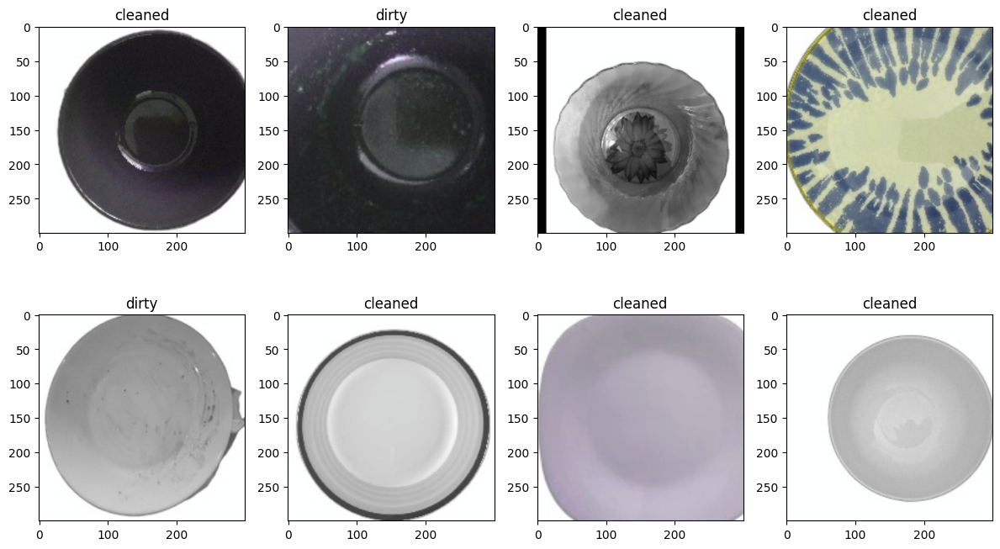

In [18]:
def show_input(X_batch, y_batch="", rows=2, figsize=(12, 7)):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    cols = (len(X_batch) + 1) // rows
    fig, ax = plt.subplots(rows, cols, figsize=figsize)
    axes_indexer = np.indices((rows, cols)).reshape(2, -1)

    for x_item, y_item, i, j in zip(X_batch, y_batch, *axes_indexer):
        image = x_item.permute(1, 2, 0).numpy()
        image = std * image + mean

        ax[i, j].imshow(image.clip(0, 1))
        ax[i, j].set_title(class_names[y_item])

    fig.tight_layout()
    plt.show()
    plt.pause(0.001)

X_batch, y_batch = next(iter(train_dataloader))
show_input(X_batch, y_batch)

# Define the model training function

In [19]:
def train_model(model, loss, optimizer, scheduler, num_epochs, scheduler_enabled=True):

    # Define some variable for training

    best_model_state = None
    best_acc = 0.0
    best_loss = float('inf')
    best_epoch = 0

    train_loss_history = []
    train_acc_history = []
    val_loss_history = []
    val_acc_history = []

    epochs_no_improve = 0

    for epoch in range(num_epochs):
        if epoch == 0 or epoch % 5 == 0 or epoch == num_epochs - 1:
          print('\nEpoch {}/{}:'.format(epoch, num_epochs - 1), flush=True)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                dataloader = train_dataloader # Get batches from the train dataset
                model.train()  # Set model to training mode
            else:
                dataloader = val_dataloader # Get batches from the validation dataset
                model.eval()   # Set model to evaluate mode to prevent the model update

            running_loss = 0.
            running_acc = 0.

            # Iterate over data batches of images and their labels
            for inputs, labels in tqdm(dataloader, disable=True):
                inputs = inputs.to(device)
                labels = labels.to(device).float() # Ensure labels are float for BCEWithLogitsLoss

                optimizer.zero_grad()  # Nullify the gradient after the epoch

                # forward and backward
                with torch.set_grad_enabled(phase == 'train'):
                    preds = model(inputs)
                    loss_value = loss(preds.squeeze(), labels)

                    # For binary classification, use 0.5 as the threshold
                    preds_class = (torch.sigmoid(preds.squeeze()) > 0.5).float()

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss_value.backward()
                        optimizer.step()

                # Calculate and save statistics
                running_loss += loss_value.item()
                running_acc += (preds_class == labels.data).float().mean()

            epoch_loss = running_loss / len(dataloader)
            epoch_acc = running_acc / len(dataloader)

            if phase == 'train':
                train_loss_history.append(epoch_loss)
                train_acc_history.append(epoch_acc)
                if scheduler_enabled:
                    scheduler.step()
            else:
                val_loss_history.append(epoch_loss)
                val_acc_history.append(epoch_acc)
                
                # Save the best model
                if epoch_acc > best_acc or (epoch_acc == best_acc and epoch_loss < best_loss):
                    best_epoch = epoch
                    if epoch_acc > best_acc:
                        best_acc = epoch_acc
                    best_loss = epoch_loss
                    best_model_state = copy.deepcopy(model.state_dict())


            # Print statistics
            if epoch == 0 or epoch % 5 == 0 or epoch == num_epochs - 1:
                print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc), flush=True)

    history = {
        'train_loss': train_loss_history,
        'train_acc': train_acc_history,
        'val_loss': val_loss_history,
        'val_acc': val_acc_history
    }

    print()
    print('Best model parameters:')
    print(f'Best epoch: {epoch}')
    print(f'Best accuracy: {best_acc:.4f}')
    print(f'Best loss: {best_loss:.4f}')

    return best_model_state, history

# Download and modify the model

Download a pretrained ResNet18 model, freeze its 2 first set of layers and unfreeze the second 2 set of layers, initialize additional FC layers for final classification.

Breakdown of the main body of the ResNet18 architecture:

* layer1: 2 blocks * 2 conv layers = 4 layers
* layer2: 2 blocks * 2 conv layers = 4 layers
* layer3: 2 blocks * 2 conv layers = 4 layers
* layer4: 2 blocks * 2 conv layers = 4 layers

# EfficientNet

In [20]:
from torchvision.models import efficientnet_b3, EfficientNet_B3_Weights
import torch.nn as nn

# Load the pre-trained EfficientNet-B0 model
weights = EfficientNet_B3_Weights.DEFAULT
model = efficientnet_b3(weights=weights)

# Disable learning for all layers
for param in model.parameters():
    param.requires_grad = True

# Replace the classifier
num_ftrs = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Linear(num_ftrs, 1)  # Final output for binary classification
)

# Transfer our NN to the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Define the loss function and the optimizer
loss = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1.0e-3, amsgrad=True)

# Decay LR by a factor of 0.1 every 10 epochs
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

Downloading: "https://download.pytorch.org/models/efficientnet_b3_rwightman-b3899882.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_rwightman-b3899882.pth
100%|██████████| 47.2M/47.2M [00:00<00:00, 166MB/s]


# ResNet

In [21]:
# weights = ResNet152_Weights.DEFAULT
# model = resnet152(weights=weights)

# # Disable learning for all layers
# for param in model.parameters():
#     param.requires_grad = True
    
# # Enable learning for layers 3 and 4
# # for param in model.layer2.parameters():
# #      param.requires_grad = True
    
# # for param in model.layer3.parameters():
# #     param.requires_grad = True

# # for param in model.layer4.parameters():
# #     param.requires_grad = True

# # Set the droput rate
# drop_rate = 0.4

# # Create a sequence of fully connected layers that we will train
# model.fc = nn.Sequential(

#     nn.BatchNorm1d(model.fc.in_features),

#     nn.Linear(model.fc.in_features, 2048),
#     nn.ReLU(),
#     nn.Dropout(drop_rate),
#     nn.BatchNorm1d(2048),

#     nn.Linear(2048, 512),
#     nn.ReLU(),
#     nn.Dropout(drop_rate),
#     nn.BatchNorm1d(512),

#     nn.Linear(512, 1)  # Final output for binary classification
    
#      #nn.Linear(model.fc.in_features, 1)
# )

# # Transfer our NN to the GPU
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# model = model.to(device)

# # Define the loss function and the optimizer
# loss = torch.nn.BCEWithLogitsLoss()
# optimizer = torch.optim.Adam(model.parameters(), lr=1.0e-3, amsgrad=True)
# #optimizer = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)

# # Decay LR by a factor of 0.1 every 7 epochs
# #scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Run the training procedure and plot the results


Epoch 0/49:
train Loss: 0.4237 Acc: 0.8438
val Loss: 0.0545 Acc: 1.0000

Epoch 5/49:
train Loss: 0.2705 Acc: 0.9167
val Loss: 0.3303 Acc: 0.9062

Epoch 10/49:
train Loss: 0.0332 Acc: 1.0000
val Loss: 0.0385 Acc: 0.9896

Epoch 15/49:
train Loss: 0.0395 Acc: 0.9792
val Loss: 0.0081 Acc: 1.0000

Epoch 20/49:
train Loss: 0.0092 Acc: 1.0000
val Loss: 0.0105 Acc: 1.0000

Epoch 25/49:
train Loss: 0.0191 Acc: 1.0000
val Loss: 0.0046 Acc: 1.0000

Epoch 30/49:
train Loss: 0.2458 Acc: 0.9271
val Loss: 0.0048 Acc: 1.0000

Epoch 35/49:
train Loss: 0.0133 Acc: 1.0000
val Loss: 0.0079 Acc: 1.0000

Epoch 40/49:
train Loss: 0.0083 Acc: 1.0000
val Loss: 0.0059 Acc: 1.0000

Epoch 45/49:
train Loss: 0.0158 Acc: 1.0000
val Loss: 0.0105 Acc: 1.0000

Epoch 49/49:
train Loss: 0.0097 Acc: 1.0000
val Loss: 0.0048 Acc: 1.0000

Best model parameters:
Best epoch: 49
Best accuracy: 1.0000
Best loss: 0.0018


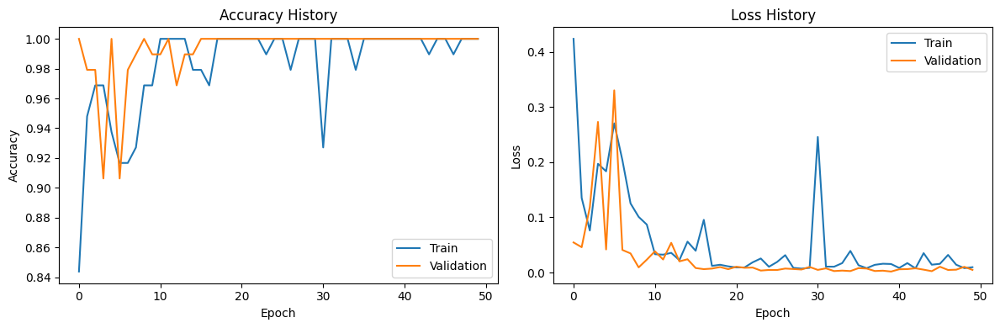

In [22]:
best_model_state, history = train_model(model, loss, optimizer, scheduler, num_epochs=50, scheduler_enabled=True);

# Load the best model
model.load_state_dict(best_model_state)

# Plot the results
plot_training_history(history)

# Use the model on the test dataset 

The testing dataset is located in another folder, so we will use a trick to feed these pictures using the ImageFolder.

In [23]:
test_dir = 'test'
shutil.copytree(os.path.join(data_root, 'test'), os.path.join(test_dir, 'unknown'), dirs_exist_ok=True)

'test/unknown'

In [24]:
class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
    
test_dataset = ImageFolderWithPaths('/kaggle/working/test', get_transforms(is_train=False))

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

In [25]:
test_dataset

Dataset ImageFolderWithPaths
    Number of datapoints: 744
    Root location: /kaggle/working/test
    StandardTransform
Transform: Compose(
               RandomPerspective(p=0.1)
               RandomChoice(
               CenterCrop(size=(180, 180))
               CenterCrop(size=(160, 160))
               CenterCrop(size=(140, 140))
               CenterCrop(size=(120, 120))
               Compose(
               CenterCrop(size=(280, 280))
               Grayscale(num_output_channels=3)
           )
               Compose(
               CenterCrop(size=(200, 200))
               Grayscale(num_output_channels=3)
           )
           )(p=None)
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ColorJitter(brightness=None, contrast=None, saturation=None, hue=(0.1, 0.2))
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [26]:
model.eval()

test_predictions = []
test_img_paths = []

for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    with torch.no_grad():
        preds = model(inputs)
        # For binary classification, use sigmoid instead of softmax
        preds = torch.sigmoid(preds).squeeze()
    test_predictions.append(preds.cpu().numpy())
    test_img_paths.extend(paths)

test_predictions = np.concatenate(test_predictions)

100%|██████████| 93/93 [00:05<00:00, 15.59it/s]


In [27]:
test_labels = (test_predictions > 0.5).astype(int)

In [28]:
def show_input(input_tensor, title=''):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)

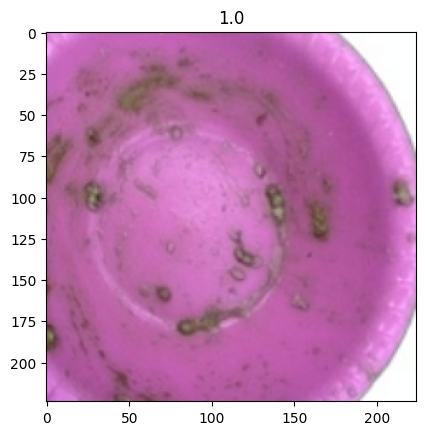

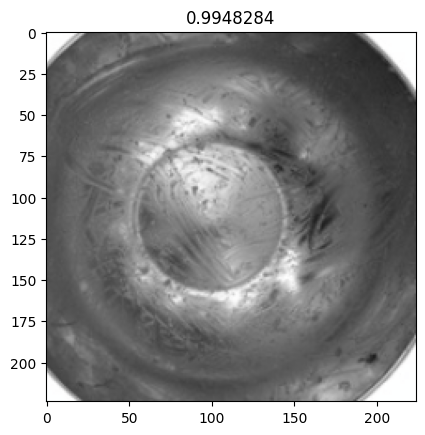

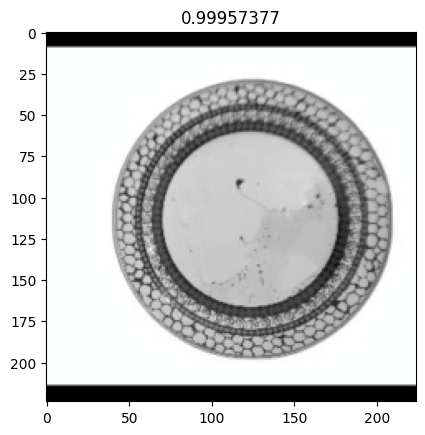

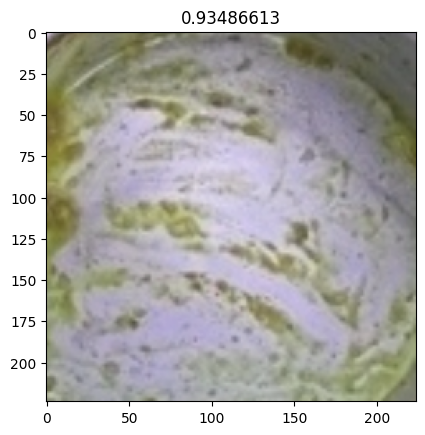

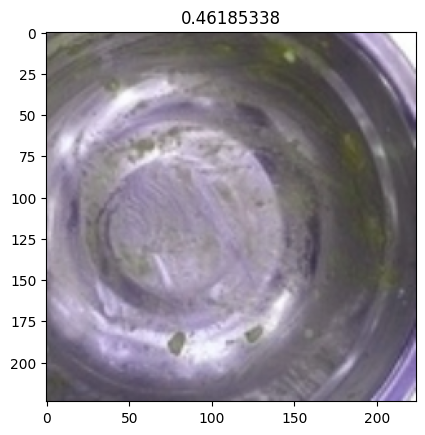

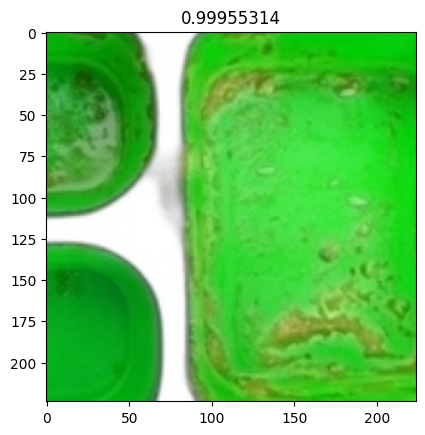

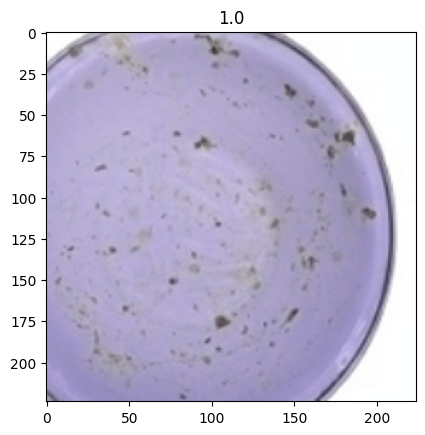

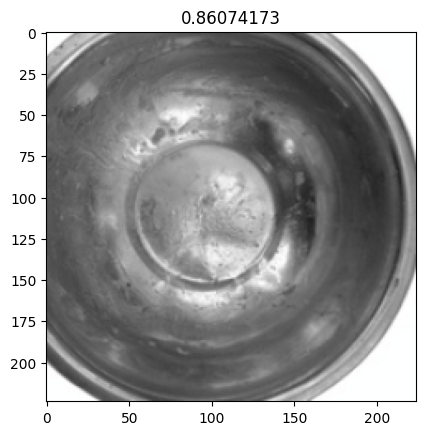

In [29]:
inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)

In [30]:
submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})

In [31]:
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('/kaggle/working/test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

,label
id,
0000,dirty
0001,dirty
0002,dirty
0003,dirty
0004,cleaned
0005,dirty


In [32]:
submission_df.to_csv('submission.csv')

In [33]:
#!rm -rf train val test